In [1]:
import cv2
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from collections import Counter
import tensorflow as tf
from tensorflow import keras

import sys
from pathlib import Path
scripts_dir = Path().resolve()

function_dir = scripts_dir.parent
sys.path.insert(0, str(function_dir))
import Functions.mouse as mouse
import SSM.ssm as ssm
from SSM.ssm.plots import gradient_cmap

parent_dir = scripts_dir.parent.parent/'aeon_mecha'
sys.path.insert(0, str(parent_dir))
import aeon
import aeon.io.api as api
from aeon.io import reader, video
from aeon.schema.schemas import social02

LABELS = [
    ['AEON3', 'Pre','BAA-1104045'],
    ['AEON3', 'Pre','BAA-1104047'],
    ['AEON3', 'Post','BAA-1104045'],
    ['AEON3', 'Post','BAA-1104047'],
    ['AEON4', 'Pre','BAA-1104048'], 
    ['AEON4', 'Pre','BAA-1104049'],
    ['AEON4', 'Post','BAA-1104048'],
    ['AEON4', 'Post','BAA-1104049']
]
nodes_name = ['nose', 'head', 'right_ear', 'left_ear', 'spine1', 'spine2','spine3', 'spine4']
color_names = [
    'black', 'blue', 'red', 'tan', 'green', 'brown', 
    'purple', 'orange', 'turquoise', 'yellow', 'pink', 
    'darkblue', 'lime', 'cyan', 'magenta', 'gold', 
    'navy', 'maroon', 'teal', 'grey'
]

2024-06-25 11:58:08.892601: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /nfs/nhome/live/zimol/.local/lib/python3.9/site-packages/cv2/../../lib64:
2024-06-25 11:58:08.892668: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# **0. Get Data for the Single-Mouse Experiment**

In [11]:
Mouse = mouse.Mouse(aeon_exp = 'AEON4', type = 'Pre', mouse = 'BAA-1104048')

## ***I. Information***

In [12]:
print(Mouse.aeon_exp, Mouse.type, Mouse.mouse)
print(Mouse.root)

AEON4 Pre BAA-1104048
/ceph/aeon/aeon/data/raw/AEON4/social0.2/


## ***II. Body Labels Position from SLEAP***

In [13]:
display(Mouse.body_data_x.head())
display(Mouse.body_data_y.head())

,nose,head,right_ear,left_ear,spine1,spine2,spine3,spine4
2024-01-31 10:15:55.580,NaN,NaN,NaN,NaN,NaN,1440.124146,1440.174316,NaN
2024-01-31 10:15:55.680,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-31 10:15:55.780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-31 10:15:55.880,NaN,NaN,NaN,NaN,NaN,1138.402588,1140.317139,1143.042847
2024-01-31 10:15:55.980,NaN,1124.104614,NaN,1123.277344,1129.070801,1131.162109,1131.721924,1133.550293


,nose,head,right_ear,left_ear,spine1,spine2,spine3,spine4
2024-01-31 10:15:55.580,NaN,NaN,NaN,NaN,NaN,232.078247,224.670441,NaN
2024-01-31 10:15:55.680,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-31 10:15:55.780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-31 10:15:55.880,NaN,NaN,NaN,NaN,NaN,304.230286,310.253052,316.857605
2024-01-31 10:15:55.980,NaN,280.38916,NaN,283.868713,288.362335,296.057037,303.131226,310.896484


## ***III. Centroid Position Inferred from LDS***

In [14]:
display(Mouse.mouse_pos.head())

,x,y,smoothed_position_x,smoothed_position_y,smoothed_speed,smoothed_acceleration
2024-01-31 10:15:55.580,1440.124146,232.078247,1334.272968,258.259400,165.330703,1653.834301
2024-01-31 10:15:55.680,1339.550293,256.128927,1308.228289,262.548317,362.582514,1972.627669
2024-01-31 10:15:55.780,1238.976440,280.179606,1266.428314,269.081175,483.575155,1210.601449
2024-01-31 10:15:55.880,1138.402588,304.230286,1218.637541,276.208300,482.814602,28.659505
2024-01-31 10:15:55.980,1131.162109,296.057037,1176.092231,282.788350,378.245702,1048.775460


In [15]:
exp_session = mouse.Session(aeon_exp = Mouse.aeon_exp, type = Mouse.type, mouse = Mouse.mouse, start = Mouse.starts[0], end = Mouse.ends[0])
exp_session.kinematics.Run(Mouse)
mouse_lds_parameters = exp_session.kinematics.parameters
print(mouse_lds_parameters['sigma_a'])
print(mouse_lds_parameters['sigma_x'])
print(mouse_lds_parameters['sigma_y'])

25.049131393432617
-1.0851688466478784
1.1287684076899842


## ***IV. Foraging Activity Information***

In [16]:
Mouse.Run_Visits()

Get_Visits Completed


### ***i. Enter Arena***

In [17]:
print(Mouse.arena.radius)
print(Mouse.arena.origin)
print(Mouse.arena.patch_location)

496.0
[680, 565]
{'Patch1': array([872.25, 567.  ]), 'Patch2': array([580.75, 738.  ]), 'Patch3': array([579.5 , 398.75])}


In [18]:
display(Mouse.arena.entry)

DatetimeIndex(['2024-01-31 10:22:18.480000', '2024-01-31 10:23:02.180000',
               '2024-01-31 10:24:52.480000', '2024-01-31 10:28:32.880000',
               '2024-01-31 10:30:08.980000', '2024-01-31 10:33:27.380000',
               '2024-01-31 10:35:30.480000', '2024-01-31 10:38:26.280000',
               '2024-01-31 10:41:06.080000', '2024-01-31 10:48:37.980000',
               ...
               '2024-02-03 15:44:23.780000', '2024-02-03 15:49:04.380000',
               '2024-02-03 15:50:08.780000', '2024-02-03 15:58:45.980000',
               '2024-02-03 15:59:25.580000', '2024-02-03 15:59:46.080000',
               '2024-02-03 16:20:17.980000', '2024-02-03 16:25:02.480000',
               '2024-02-03 16:25:44.680000', '2024-02-03 16:32:11.680000'],
              dtype='datetime64[ns]', length=489, freq=None)

### ***ii. Visits in Patch***

In [19]:
display(Mouse.arena.visits.head())

,start,end,duration,speed,acceleration,entry,patch,pellet,last_pellets_self,last_pellets_other,last_interval,next_interval,last_duration,last_pellets_interval
0,2024-01-31 10:15:56.601984024,2024-01-31 10:16:04.121984005,7.519999,311.992604,1186.049334,-382.178016,Patch2,0.0,0,0,0.000000,62.239999,0.000000,0.000000
1,2024-01-31 10:17:06.361983776,2024-01-31 10:17:11.532000064,5.170016,215.662341,253.592473,-312.418017,Patch2,0.0,0,0,62.239999,9641.205984,7.519999,69.759998
2,2024-01-31 12:57:52.737984180,2024-01-31 12:58:56.788000107,64.050015,21.333069,54.453137,74.557984,Patch3,0.0,0,0,9641.205984,103.487999,5.170016,9716.135998
3,2024-01-31 13:00:40.276000023,2024-01-31 13:01:03.895999908,23.619999,71.143135,163.106800,242.096000,Patch3,0.0,0,0,103.487999,20.340000,64.050015,9883.674012
4,2024-01-31 13:01:24.236000061,2024-01-31 13:01:58.076000214,33.840000,59.500114,152.351966,286.056000,Patch1,1.0,0,0,20.340000,21.029983,23.619999,9927.634011


### ***iii. Pellet Delivery***

In [20]:
display(Mouse.arena.pellets.head())

,event
time,
2024-01-31 10:16:42.625504017,TriggerPellet
2024-01-31 10:16:44.184480190,TriggerPellet
2024-01-31 10:16:46.466495991,TriggerPellet
2024-01-31 13:01:56.155488014,TriggerPellet
2024-01-31 13:05:24.997504234,TriggerPellet


# **1. Process Body Information**

In [21]:
# Use PCA to find the most varied distance between two nodes
Nodes_Distance = {}
for i in range(len(nodes_name)):
    for j in range(i+1, len(nodes_name)):
        node1, node2 = nodes_name[i], nodes_name[j]
        Nodes_Distance[node1 + '-' + node2] = Mouse.body_info.Process_Body_Node_Distance(node1, node2).to_numpy()
Nodes_Distance = pd.DataFrame(Nodes_Distance)
for col in Nodes_Distance.columns:
    Nodes_Distance[col] = Nodes_Distance[col].interpolate()
    Nodes_Distance[col] = Nodes_Distance[col].bfill()
display(Nodes_Distance.head())

distance_array = Nodes_Distance.values
distance_arrayZ = stats.zscore(distance_array)
U, s, Vh = np.linalg.svd(distance_arrayZ, full_matrices=False)
loading1 = Vh[0]
idx = np.argsort(abs(loading1))[::-1]

print(Nodes_Distance.columns[idx])

,nose-head,nose-right_ear,nose-left_ear,nose-spine1,nose-spine2,nose-spine3,nose-spine4,head-right_ear,head-left_ear,head-spine1,...,left_ear-spine1,left_ear-spine2,left_ear-spine3,left_ear-spine4,spine1-spine2,spine1-spine3,spine1-spine4,spine2-spine3,spine2-spine4,spine3-spine4
0,4.520561,9.286724,9.884827,14.097438,21.159731,12.166456,2.904065,3.966466,3.576544,9.393324,...,7.331902,14.516362,21.032245,28.914251,7.973833,15.004952,22.975068,7.407976,13.452925,7.144901
1,4.520561,9.286724,9.884827,14.097438,21.159731,12.166456,2.904065,3.966466,3.576544,9.393324,...,7.331902,14.516362,21.032245,28.914251,7.973833,15.004952,22.975068,7.045234,13.452925,7.144901
2,4.520561,9.286724,9.884827,14.097438,21.159731,12.166456,2.904065,3.966466,3.576544,9.393324,...,7.331902,14.516362,21.032245,28.914251,7.973833,15.004952,22.975068,6.682491,13.452925,7.144901
3,4.520561,9.286724,9.884827,14.097438,21.159731,12.166456,2.904065,3.966466,3.576544,9.393324,...,7.331902,14.516362,21.032245,28.914251,7.973833,15.004952,22.975068,6.319748,13.452925,7.144901
4,4.520561,9.286724,9.884827,14.097438,21.159731,12.166456,2.904065,3.966466,3.576544,9.393324,...,7.331902,14.516362,21.032245,28.914251,7.973833,15.004952,22.975068,7.096304,15.030390,7.977605


Index(['nose-spine3', 'head-spine3', 'spine1-spine3', 'spine1-spine4',
       'right_ear-spine3', 'head-spine2', 'left_ear-spine3', 'spine1-spine2',
       'left_ear-spine4', 'nose-spine4', 'head-spine4', 'nose-spine2',
       'right_ear-spine4', 'spine2-spine3', 'right_ear-spine2',
       'left_ear-spine2', 'spine2-spine4', 'nose-spine1', 'nose-head',
       'head-spine1', 'nose-left_ear', 'nose-right_ear', 'right_ear-spine1',
       'left_ear-spine1', 'spine3-spine4', 'right_ear-left_ear',
       'head-right_ear', 'head-left_ear'],
      dtype='object')


In [22]:
NODES = [['head', 'spine3'],['spine1', 'spine3'],['left_ear', 'spine3'],['right_ear', 'spine3']]
for nodes in NODES:
    Mouse.Add_Body_Info_to_mouse_pos(property = 'distance', nodes = nodes)
    #Display_Body_Info(Mouse, property = 'distance', nodes = nodes)
display(Mouse.mouse_pos.head())

,x,y,smoothed_position_x,smoothed_position_y,smoothed_speed,smoothed_acceleration,r,head-spine3,spine1-spine3,left_ear-spine3,right_ear-spine3
2024-01-31 10:15:55.580,1440.124146,232.078247,1334.272968,258.259400,165.330703,1653.834301,722.608408,23.983848,15.004952,21.032245,25.522259
2024-01-31 10:15:55.680,1339.550293,256.128927,1308.228289,262.548317,362.582514,1972.627669,697.243002,23.983848,15.004952,21.032245,25.522259
2024-01-31 10:15:55.780,1238.976440,280.179606,1266.428314,269.081175,483.575155,1210.601449,656.860806,23.983848,15.004952,21.032245,25.522259
2024-01-31 10:15:55.880,1138.402588,304.230286,1218.637541,276.208300,482.814602,28.659505,611.171864,23.983848,15.004952,21.032245,25.522259
2024-01-31 10:15:55.980,1131.162109,296.057037,1176.092231,282.788350,378.245702,1048.775460,570.745930,23.983848,15.004952,21.032245,25.522259


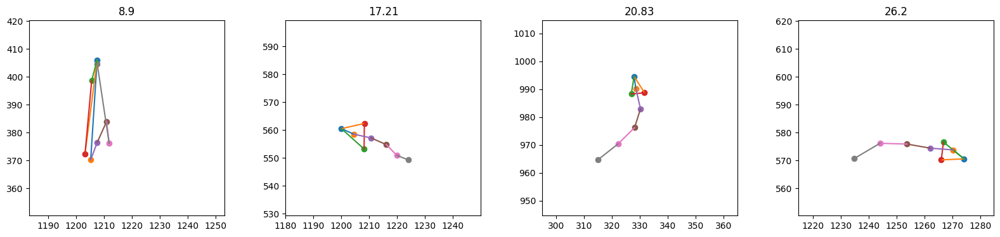

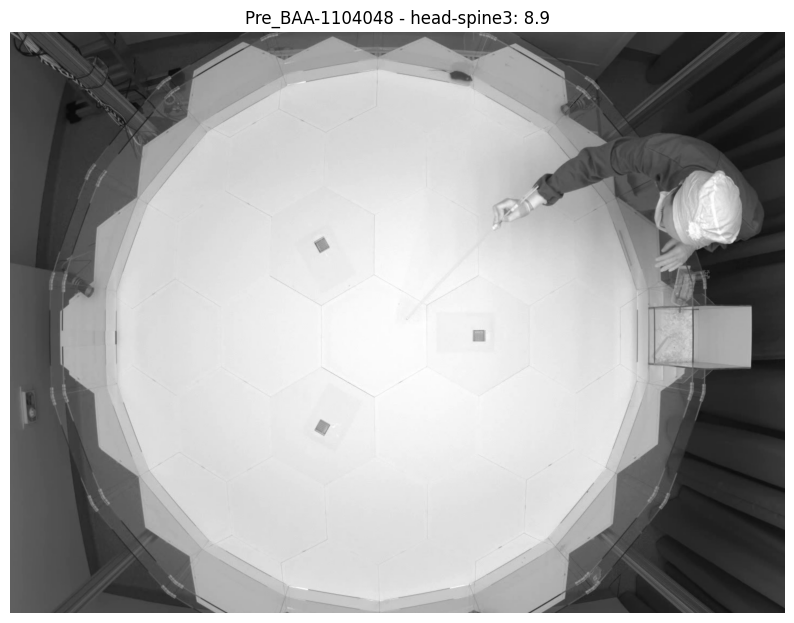

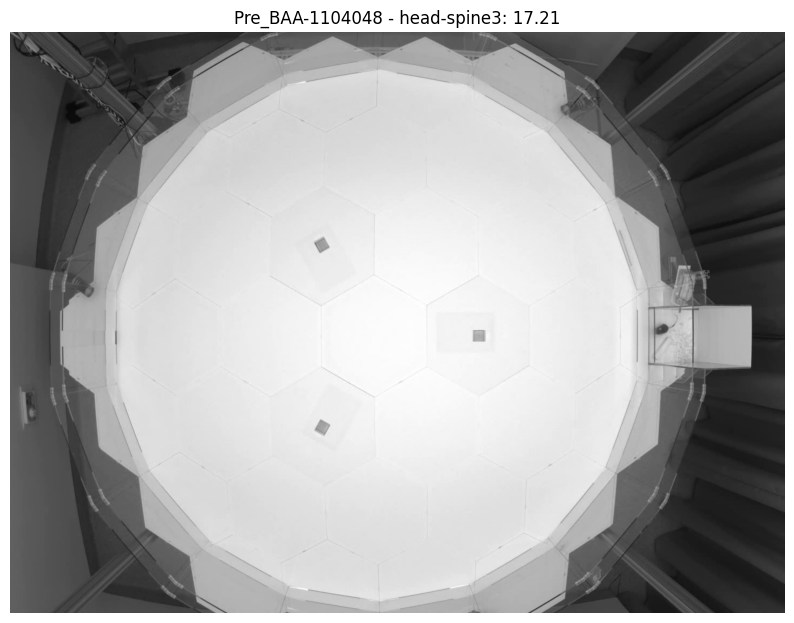

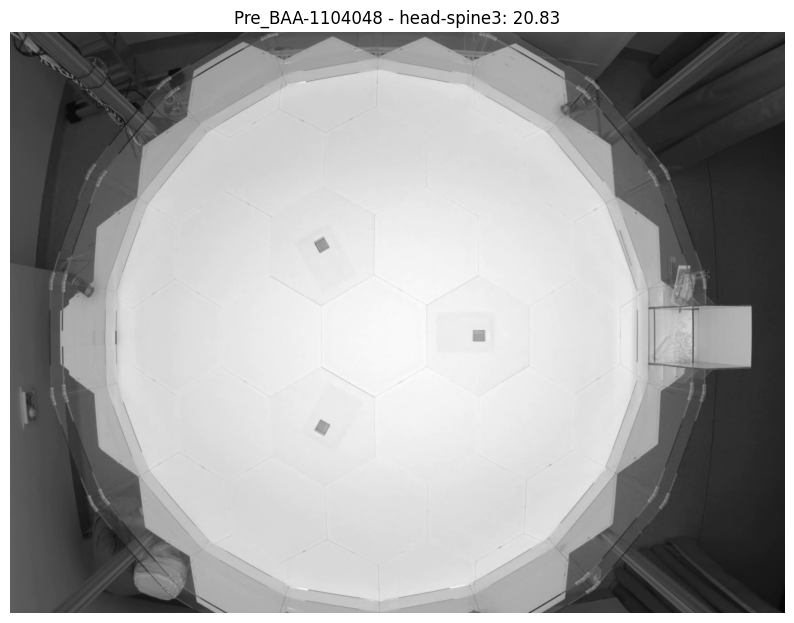

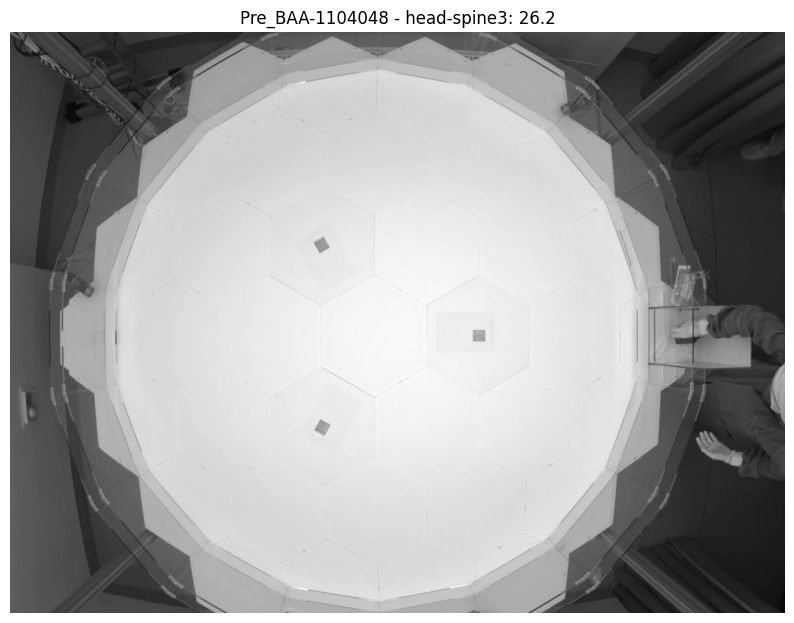

In [23]:
def Display_Body_Info(Mouse, property, nodes):
    def n_Cluster(variable):
        n_cluster = {
            'spine1-spine3': 3, 
            'head-spine3': 4, 
            'right_ear-spine3': 5,
            'left_ear-spine3': 5
        }
        return n_cluster[variable]
    
    def Get_Pose_Frame(variable, value_str, time):
        start, end = time, time + pd.Timedelta("0.2S")
        root = Mouse.root
        video_metadata = aeon.load(root, social02.CameraTop.Video, start=start, end=end)
        video_metadata.index = video_metadata.index.round("20L")
        frames = video.frames(video_metadata)
        first_frame = next(frames)
        #cv2.imwrite("../Images/Social_BodyInfo/" + variable + '/frames/' + Mouse_title + '_' + value_str + '.jpg', first_frame)
        
        rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 8))
        plt.imshow(rgb_frame)
        plt.title(f"{Mouse_title} - {variable}: {value_str}")
        plt.axis('off')  # Hide axes
        plt.show()

    def DrawBody(data_x, data_y, axs):
        for k in range(len(nodes_name)): 
            axs.scatter(data_x[nodes_name[k]], data_y[nodes_name[k]])
        axs.plot([data_x['nose'],data_x['head']], [data_y['nose'],data_y['head']])
        axs.plot([data_x['left_ear'],data_x['nose']], [data_y['left_ear'],data_y['nose']])
        axs.plot([data_x['nose'],data_x['right_ear']], [data_y['nose'],data_y['right_ear']])
        axs.plot([data_x['left_ear'],data_x['right_ear']], [data_y['left_ear'],data_y['right_ear']])
        axs.plot([data_x['head'],data_x['spine1']], [data_y['head'],data_y['spine1']])
        axs.plot([data_x['spine1'],data_x['spine2']], [data_y['spine1'],data_y['spine2']])
        axs.plot([data_x['spine2'],data_x['spine3']], [data_y['spine2'],data_y['spine3']])
        axs.plot([data_x['spine3'],data_x['spine4']], [data_y['spine3'],data_y['spine4']])
        x_min, y_min = min(np.array(data_x)), min(np.array(data_y))
        axs.set_aspect('equal', 'box')
        axs.set_xlim(x_min-20, x_min+50)
        axs.set_ylim(y_min-20, y_min+50)
        return axs

    def DrawPoses(variable, center, d, axs):
        for j in range(len(center)):
            for i in range(len(data_x)):
                if abs(d[i] - center[j]) < 0.1: 
                    if np.any(np.isnan(np.array(data_x.iloc[i]))): continue
                    axs[j] = DrawBody(data_x.iloc[i],data_y.iloc[i], axs[j])
                    axs[j].set_title(str(round(center[j],2)))
                    break
        for j in range(len(center)):
            for i in range(len(data_x)):
                if abs(d[i] - center[j]) < 0.1: 
                    if np.any(np.isnan(np.array(data_x.iloc[i]))): continue
                    Get_Pose_Frame(variable, str(round(center[j],2)), time = times[i])
                    break
        return axs

    def DrawDistance(variable):
        data = mouse_pos[variable].to_numpy()
        kmeans = KMeans(n_clusters=n_Cluster(variable), random_state=0, n_init = 'auto')
        clusters = kmeans.fit_predict(data.reshape(-1, 1))
        center = np.sort(kmeans.cluster_centers_.T[0])
        
        fig, axs = plt.subplots(1,len(center), figsize = (len(center)*5,4))
        axs = DrawPoses(variable,center, data, axs)
        #plt.savefig('../Images/Social_BodyInfo/'+ variable + '/' + Mouse_title + '.png')
        plt.show()

    Mouse_title = Mouse.type + '_' + Mouse.mouse
    times = Mouse.mouse_pos.index
    mouse_pos = Mouse.mouse_pos
    
    variable = nodes[0]
    for i in range(1, len(nodes)): variable = variable + '-' + nodes[i]
    
    data_x = Mouse.body_data_x
    data_y = Mouse.body_data_y
    
    DrawDistance(variable)

Display_Body_Info(Mouse, property = 'distance', nodes = ['head', 'spine3'])

# **2. Display Kinematic Properties**

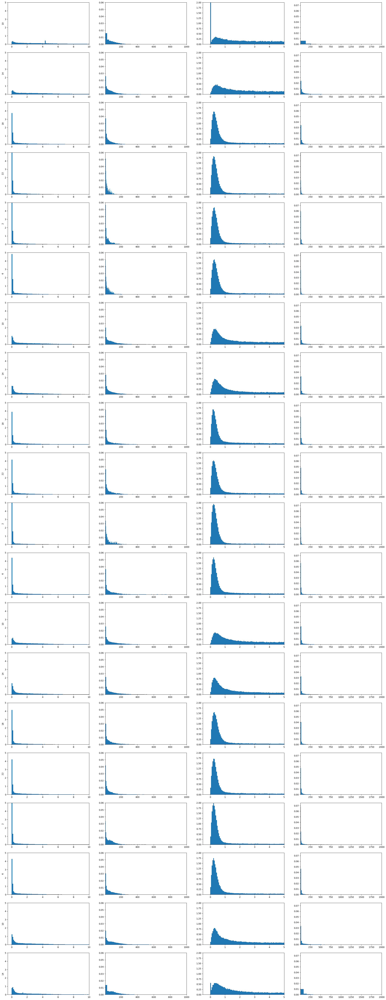

In [25]:
def Display_Kinematics_Distribution_Along_Time(Mouse):
    Mouse_title = Mouse.type + '_' + Mouse.mouse
    mouse_pos = Mouse.mouse_pos
    start, end = mouse_pos.index[0], mouse_pos.index[-1]
    starts, ends = [],[]
    while start < end:
        end_ = start + pd.Timedelta('4H')

        starts.append(start)
        ends.append(end_)
        start = end_ + pd.Timedelta('1S')

    n = len(starts)
    fig, axs = plt.subplots(n, 4, figsize = (30, 4*n))
    for i in range(n):
        df = mouse_pos[starts[i]:ends[i]]
        speed = df.smoothed_speed
        axs[i,0].hist(speed[speed<10], density = True, bins = 100)
        axs[i,0].set_xlim((-0.5,10))
        axs[i,0].set_ylim((0,5))
        axs[i,1].hist(speed[speed>10], density = True, bins = 100)
        axs[i,1].set_xlim((9.5,1000))
        axs[i,1].set_ylim((0,0.06))
        
        acce = df.smoothed_acceleration
        axs[i,2].hist(acce[acce<5], density = True, bins = 100)
        axs[i,2].set_xlim((-0.5,5))
        axs[i,2].set_ylim((0,2))
        axs[i,3].hist(acce[acce>5], density = True, bins = 100)
        axs[i,3].set_xlim((4.5,2000))
        axs[i,3].set_ylim((0, 0.075))
        
        axs[i,0].set_ylabel(starts[i].hour)
    #plt.savefig(file_path + Mouse_title+'.png')
    plt.show()
    
Display_Kinematics_Distribution_Along_Time(Mouse)

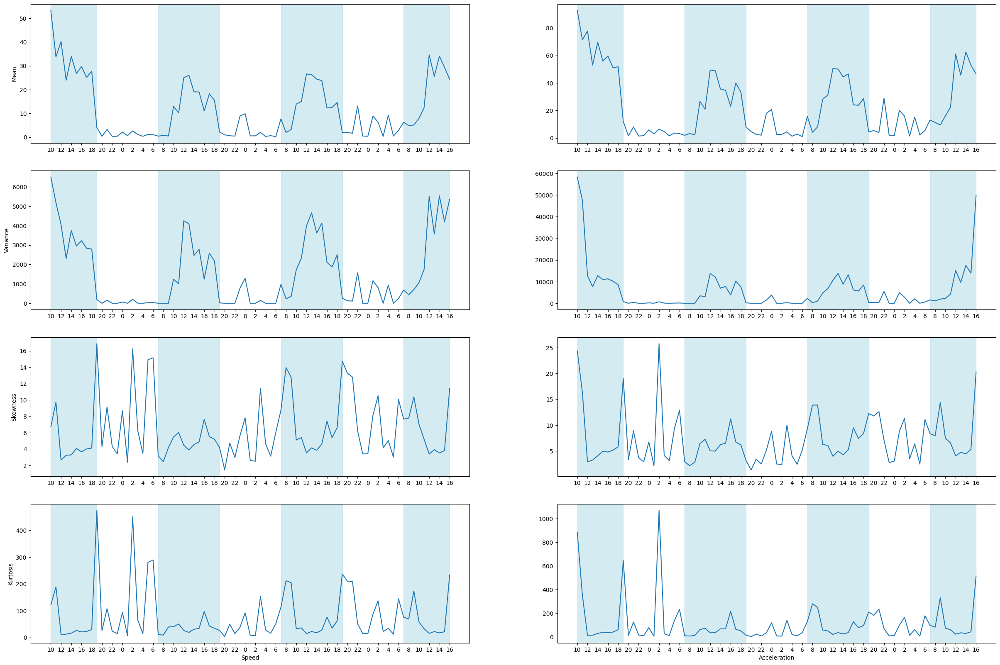

In [26]:
def Display_Kinematics_Properties_Along_Time(Mouse):   
    def Calculate_Properties(dist):
        mean = np.mean(dist)
        variance = np.var(dist)
        skewness = stats.skew(dist)
        kurtosis = stats.kurtosis(dist)
        return mean, variance, skewness, kurtosis

    Mouse_title = Mouse.type + '_' + Mouse.mouse
    mouse_pos = Mouse.mouse_pos
    start, end = mouse_pos.index[0], mouse_pos.index[-1]
    starts, ends = [],[]
    while start < end:
        if start.minute != 0:
            end_ = pd.Timestamp(year = start.year, month = start.month, day = start.day, hour = start.hour+1, minute=0, second=0)
        else: 
            end_ = start + pd.Timedelta('1H')

        starts.append(start)
        ends.append(end_)
        start = end_        
    
    Mean_V, Variance_V, Skewness_V, Kurtosis_V = [], [], [], []
    Mean_A, Variance_A, Skewness_A, Kurtosis_A = [], [], [], []
    Hour = []
    n = len(starts)
    
    CR = []
    for i in range(n):
        df = mouse_pos[starts[i]:ends[i]]
        speed = df.smoothed_speed
        mean, variance, skewness, kurtosis = Calculate_Properties(speed)
        Mean_V.append(mean)
        Variance_V.append(variance)
        Skewness_V.append(skewness)
        Kurtosis_V.append(kurtosis)
        
        acce = df.smoothed_acceleration
        mean, variance, skewness, kurtosis = Calculate_Properties(acce)
        Mean_A.append(mean)
        Variance_A.append(variance)
        Skewness_A.append(skewness)
        Kurtosis_A.append(kurtosis)
        
        Hour.append(starts[i].hour)
        if starts[i].hour == 7 or starts[i].hour == 19: CR.append(i)
    CR = np.array(CR)
    if starts[CR[0]].hour == 19: CR = np.concatenate((np.array([0]), CR))
    if starts[CR[-1]].hour == 7: CR = np.concatenate((CR, np.array([n-1])))
    
    N = np.arange(n)
    fis, axs = plt.subplots(4, 2, figsize = (30, 20))
    axs[0,0].plot(N, Mean_V)
    axs[0,0].set_ylabel('Mean')
    axs[1,0].plot(N, Variance_V)
    axs[1,0].set_ylabel('Variance')
    axs[2,0].plot(N, Skewness_V)
    axs[2,0].set_ylabel('Skewness')
    axs[3,0].plot(N, Kurtosis_V)
    axs[3,0].set_ylabel('Kurtosis')
    axs[0,1].plot(N, Mean_A)
    axs[1,1].plot(N, Variance_A)
    axs[2,1].plot(N, Skewness_A)
    axs[3,1].plot(N, Kurtosis_A)
    axs[3,0].set_xlabel('Speed')
    axs[3,1].set_xlabel('Acceleration')
    for i in range(4):
        for j in range(2):
            axs[i,j].set_xticks(N[::2], Hour[::2])
            for t in range(0,len(CR),2):
                axs[i,j].axvspan(CR[t],CR[t+1], color='lightblue', alpha=0.5)
    #plt.savefig(file_path + Mouse_title+'.png')
    #print('Display_Kinematics_Properties_Along_Time Completed')
    plt.show()

Display_Kinematics_Properties_Along_Time(Mouse)

# **3. Display HMM Results**

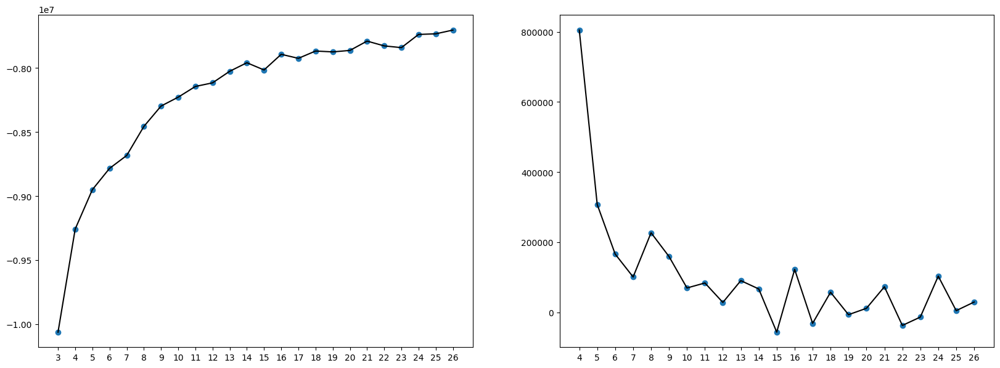

In [27]:
from IPython.display import Image, display

def Display_Model_Selection(Mouse, N, file_path):
    Mouse_title = Mouse.type + '_' + Mouse.mouse
    try:
        Loglikelihood = np.load('../SocialData/HMMStates/Loglikelihood_' + Mouse_title + '.npy', allow_pickle=True)
    except FileNotFoundError:
        Loglikelihood = []
        for n in N:
            Mouse.hmm.Fit_Model_without_Saving(n_state = n, feature = 'Kinematics_and_Body')
            Loglikelihood.append(Mouse.hmm.loglikelihood)
            print('End Inference for n = ', str(n))
        Loglikelihood = np.array(Loglikelihood)
        np.save('../SocialData/HMMStates/Loglikelihood_' + Mouse_title + '.npy', Loglikelihood)
    
    fig, axs = plt.subplots(1,2,figsize = (20,7))
    axs[0].scatter(N, Loglikelihood)
    axs[0].plot(N, Loglikelihood, color = 'black')
    axs[0].set_xticks(N)
    
    df = Loglikelihood[1:] - Loglikelihood[:-1]
    axs[1].scatter(N[1:], df)
    axs[1].plot(N[1:], df, color = 'black')
    axs[1].set_xticks(N[1:])
    #plt.savefig(file_path + Mouse_title + '.png')
    plt.show()

Display_Model_Selection(Mouse, N = np.arange(3, 27), file_path = '../Images/Social_HMM/StateNumber/')
#display(Image(filename='../Images/Social_HMM/StateNumber/' + Mouse.type + '_' + Mouse.mouse + '.png'))

In [29]:
Mouse.hmm.n_state = 20
Mouse.hmm.feature = 'Kinematics_and_Body'
#Mouse.hmm.Fit_Model(n_state = 20, feature = 'Kinematics_and_Body')
Mouse.hmm.Get_TransM(n_state = 20, feature = 'Kinematics_and_Body')
Mouse.hmm.Get_States(n_state = 20, feature = 'Kinematics_and_Body')

print(Mouse.hmm.features)
print(Mouse.hmm.parameters)

['smoothed_speed', 'smoothed_acceleration', 'spine1-spine3', 'head-spine3', 'right_ear-spine3', 'left_ear-spine3']
None


## ***I. Transition Matrix***

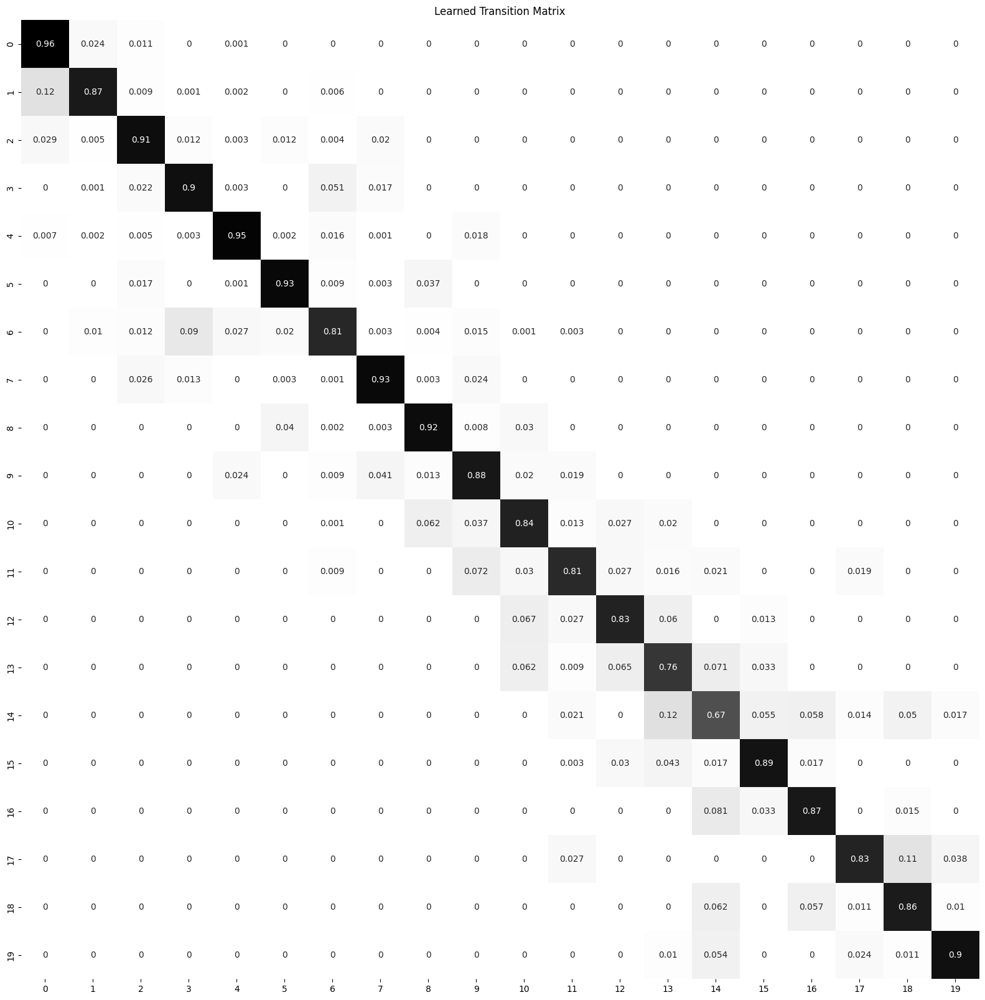

In [30]:
def Display_HMM_TransM(Mouse):
    Mouse_title = Mouse.type + '_' + Mouse.mouse
    TransM = Mouse.hmm.TransM
    annot_array = np.array([[round(item, 3) for item in row] for row in TransM])
    fig, axs = plt.subplots(1,1, figsize=(len(TransM), len(TransM)))
    sns.heatmap(TransM, cmap='binary', ax = axs, square = 'True', cbar = False, annot=annot_array)
    axs.set_title("Learned Transition Matrix") 
    plt.show()

Display_HMM_TransM(Mouse)

## ***II. States (in One Day)***

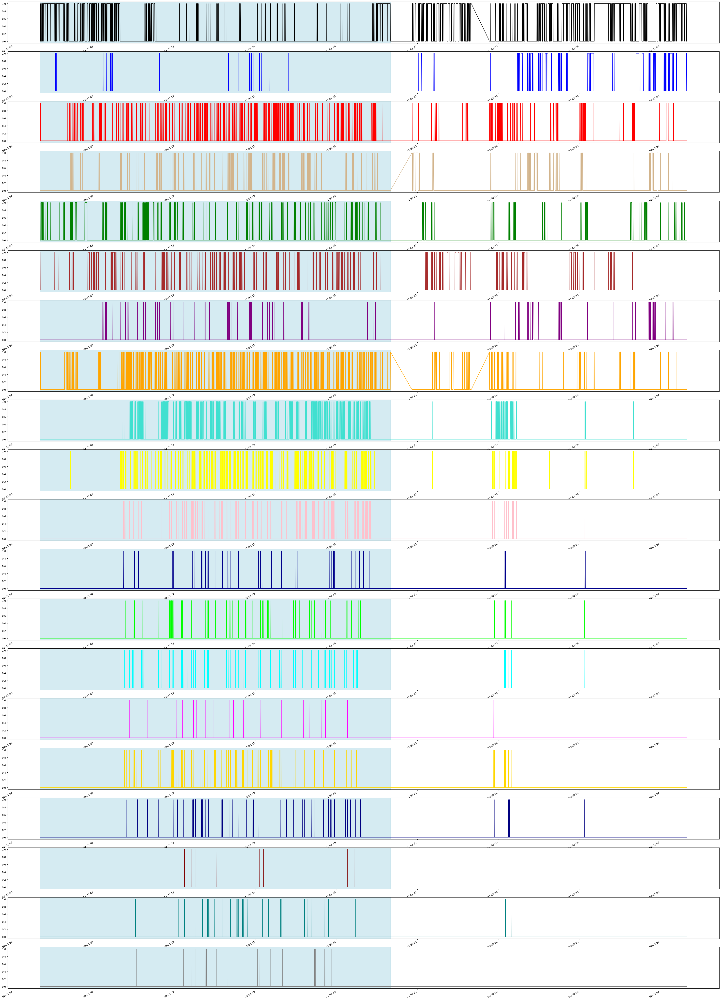

In [31]:
def Display_HMM_States_Along_Time(Mouse):
    Mouse_title = Mouse.type + '_' + Mouse.mouse
    mouse_pos = Mouse.mouse_pos
    N = Mouse.hmm.n_state
    states = Mouse.hmm.states
    start, end = Mouse.active_chunk[0], Mouse.active_chunk[1]
    
    mouse_pos['state'] = pd.Series(states, index = mouse_pos.index)
    mouse_pos = mouse_pos[start:end]
    
    states_prob = Mouse.hmm.process_states.State_Dominance(mouse_pos, time_seconds = 10)
    states_prob['CR'] = 0
    CR_index_1 = states_prob[states_prob.index.hour < 7].index
    CR_index_2 = states_prob[states_prob.index.hour > 19].index
    CR_index = CR_index_1.union(CR_index_2).sort_values()
    states_prob.loc[CR_index, 'CR'] = 1
    groups = states_prob['CR'].ne(states_prob['CR'].shift()).cumsum()
    zero_groups = states_prob[states_prob['CR'] == 0].groupby(groups).groups
    zero_groups = list(zero_groups.values())

    START, END = [],[]
    for i in range(len(zero_groups)):
        START.append(zero_groups[i][0])
        END.append(zero_groups[i][-1])

    N = max(states) + 1
    fig, axs = plt.subplots(N, 1, figsize=(50, 4*N-1))
    for i in range(N):
        states_prob[i].plot(color = color_names[i], ax = axs[i])
        for t in range(len(START)):
            axs[i].axvspan(START[t],END[t], color='lightblue', alpha=0.5)
    plt.show()

Display_HMM_States_Along_Time(Mouse) 

## ***III. Features of Each State***

In [32]:
def CollectData_Single(mouse_pos):
    x, y, speed, acce, r, spine1_spine3, head_spine3, right_ear_spine3, left_ear_spine3 = [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)]
    for i in range(N):
        x[i] =  mouse_pos['smoothed_position_x'][states==i]
        y[i] = mouse_pos['smoothed_position_y'][states==i]
        speed[i] = mouse_pos['smoothed_speed'][states==i]
        acce[i] = mouse_pos['smoothed_acceleration'][states == i]
        r[i] = mouse_pos['r'][states == i]
        spine1_spine3[i] = mouse_pos['spine1-spine3'][states == i]
        head_spine3[i] = mouse_pos['head-spine3'][states == i]
        right_ear_spine3[i] = mouse_pos['right_ear-spine3'][states == i]
        left_ear_spine3[i] = mouse_pos['left_ear-spine3'][states == i]
    return x, y, speed, acce, r, spine1_spine3, head_spine3, right_ear_spine3, left_ear_spine3

Mouse_title = Mouse.type + '_' + Mouse.mouse
mouse_pos = Mouse.mouse_pos
states = Mouse.hmm.states
N = Mouse.hmm.n_state
mouse_pos['state'] = pd.Series(states, index = mouse_pos.index)

x, y, speed, acce, r, spine1_spine3, head_spine3, right_ear_spine3, left_ear_spine3 = CollectData_Single(mouse_pos)

### ***I. Positions***

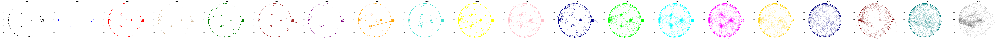

In [33]:
def PlotPosition(x, y):
    fig, axs = plt.subplots(1, N, figsize = (N*8-2,6))
    for i in range(N):
        axs[i].scatter(x[i], y[i], color = color_names[i], s = 2, alpha = 0.2)
        axs[i].set_xlim((100,1400))
        axs[i].set_ylim((-20,1100))
        axs[i].set_title('State' + str(i))
        axs[i].set_xlabel('X')
        axs[i].set_ylabel('Y')
    plt.show()

PlotPosition(x, y)

### ***II. Parameter Features***

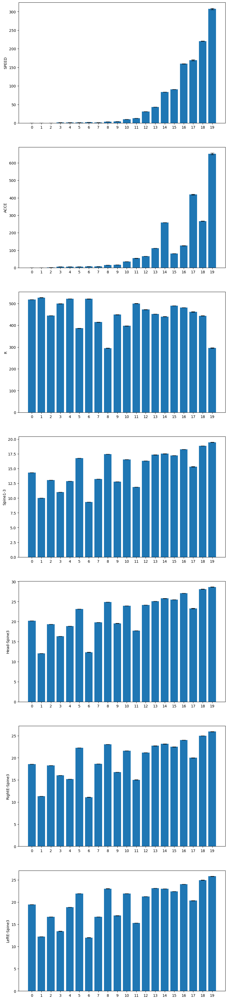

In [34]:
def PlotFeatures(DATA, FEATURE):
    fig, axs = plt.subplots(len(FEATURE), 1, figsize = (10, len(FEATURE)*7-1))
    for data, i in zip(DATA, range(len(DATA))):
        means = [np.mean(arr) for arr in data]
        var = [np.std(arr)/np.sqrt(len(arr)) for arr in data]
        axs[i].bar(range(N), means, yerr=var, capsize=5)
        axs[i].set_xticks(range(0, N), [str(j) for j in range(N)])
        axs[i].set_ylabel(FEATURE[i])
    plt.show()
    
PlotFeatures(DATA = [speed, acce, r, spine1_spine3, head_spine3, right_ear_spine3, left_ear_spine3], FEATURE = ['SPEED', 'ACCE', 'R', 'Spine1-3', 'Head-Spine3', 'RightE-Spine3', 'LeftE-Spine3'])

## ***III. Characterisation of Events***

In [35]:
def Characterize_Timepoints(event_name, Events, left_seconds, right_seconds, file_name):
    STATES = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds, right_seconds, 'state')
    X = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds, right_seconds, 'smoothed_position_x')
    Y = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds, right_seconds, 'smoothed_position_y')
    
    fig, axs = plt.subplots(1, 1, figsize=(10, 16))
    sns.heatmap(STATES,cmap=cmap, ax=axs, vmin=0, vmax = N-1, cbar = True)
    axs.set_aspect('auto')
    axs.set_xticks([10*left_seconds])
    axs.set_xticklabels([event_name], rotation = 0)
    axs.set_ylabel("Events")
    axs.set_yticks([])
    plt.show()
    
    fig, axs = plt.subplots(1, 1, figsize=(20, 20))
    mask = ~np.isnan(STATES[0])
    for i in range(len(STATES)):
        colors = np.array(color_names)[STATES[i][mask].astype(int)]
        x = X[i][mask]
        y = Y[i][mask]
        dx = np.diff(x)
        dy = np.diff(y)
        axs.quiver(x[:-1], y[:-1], dx, dy, color=colors[:-1], 
                angles='xy', scale_units='xy', scale=1.1, 
                width=0.001, headwidth=3, headlength=3)
    axs.set_aspect('equal')
    axs.set_xlim((100,1400))
    axs.set_ylim((-20,1100))
    plt.show()
    
    if event_name != 'Enter Arena':
        fig, axs = plt.subplots(1, 3, figsize=(30, 10))
        for i in range(len(STATES)):
            colors = np.array(color_names)[STATES[i][mask].astype(int)]
            x = X[i][mask]
            y = Y[i][mask]
            dx = np.diff(x)
            dy = np.diff(y)
            for j in range(len(Mouse.arena.patch)):
                axs[j].quiver(x[:-1], y[:-1], dx, dy, color=colors[:-1], 
                    angles='xy', scale_units='xy', scale=1.1, 
                    width=0.001, headwidth=4, headlength=4)
        
        patch_r = Mouse.arena.patch_r
        for i in range(len(Mouse.arena.patch)):
            patch = Mouse.arena.patch[i]
            axs[i].set_aspect('equal')
            patch_ox, patch_oy = Mouse.arena.patch_location[patch][0], Mouse.arena.patch_location[patch][1]
            x_min, x_max, y_min, y_max = patch_ox-patch_r, patch_ox+patch_r, patch_oy-patch_r, patch_oy+patch_r
            axs[i].set_xlim(x_min, x_max)
            axs[i].set_ylim(y_min, y_max)
            axs[i].set_title(patch)

        plt.tight_layout()
        plt.show()

    AVE_STATES = []
    for k in np.arange(N):
        index = STATES == k
        states = index*1
        AVE_STATES.append(np.mean(states, axis = 0))
    AVE_STATES = np.array(AVE_STATES)
    fig, axs = plt.subplots(1, 1, figsize=(10, 10))
    for i in range(AVE_STATES.shape[0]):
        color = color_names[i]
        rgba_color = plt.cm.colors.to_rgba(color)
        for j in range(AVE_STATES.shape[1]):
            if np.isnan(AVE_STATES[i, j]):
                axs.add_patch(plt.Rectangle((j, N-1-i), 0.1, 1, color=plt.cm.colors.to_rgba('black'), alpha=1, linewidth=0))
            else:
                axs.add_patch(plt.Rectangle((j, N-1-i), 1, 1, color=rgba_color, alpha=AVE_STATES[i, j], linewidth=0))
    axs.set_aspect('auto')
    axs.set_xticks([10*left_seconds])
    axs.set_xticklabels([event_name], rotation = 0)
    axs.set_ylabel("States")
    axs.set_yticks(np.arange(N) + 0.5)
    axs.set_yticklabels(np.arange(N-1,-1,-1))
    axs.set_xlim(0, AVE_STATES.shape[1])
    axs.set_ylim(0, AVE_STATES.shape[0])
    plt.show()

Mouse_title = Mouse.type + '_' + Mouse.mouse
mouse_pos = Mouse.mouse_pos
states = Mouse.hmm.states
N = Mouse.hmm.n_state

Pellets = Mouse.arena.pellets.index
Visits = Mouse.arena.visits.dropna(subset=['speed'])
Starts = Visits['start']
Ends = Visits['end']
Entry = Mouse.arena.entry 

mouse_pos['state'] = pd.Series(states, index = mouse_pos.index)

colors = sns.xkcd_palette(color_names[0:N])
cmap = gradient_cmap(colors)

### ***i. Enter Arena***

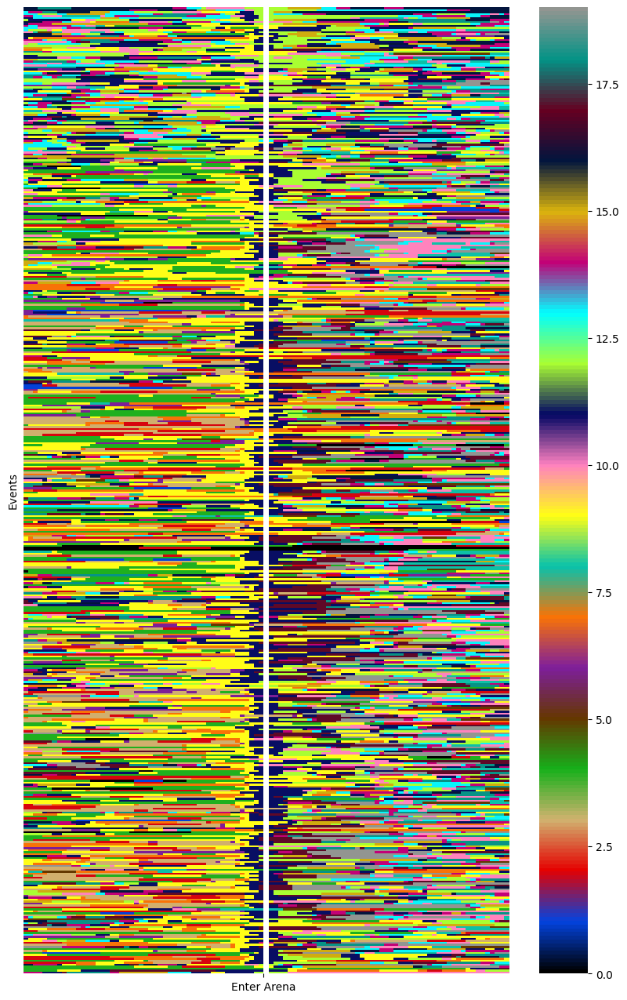

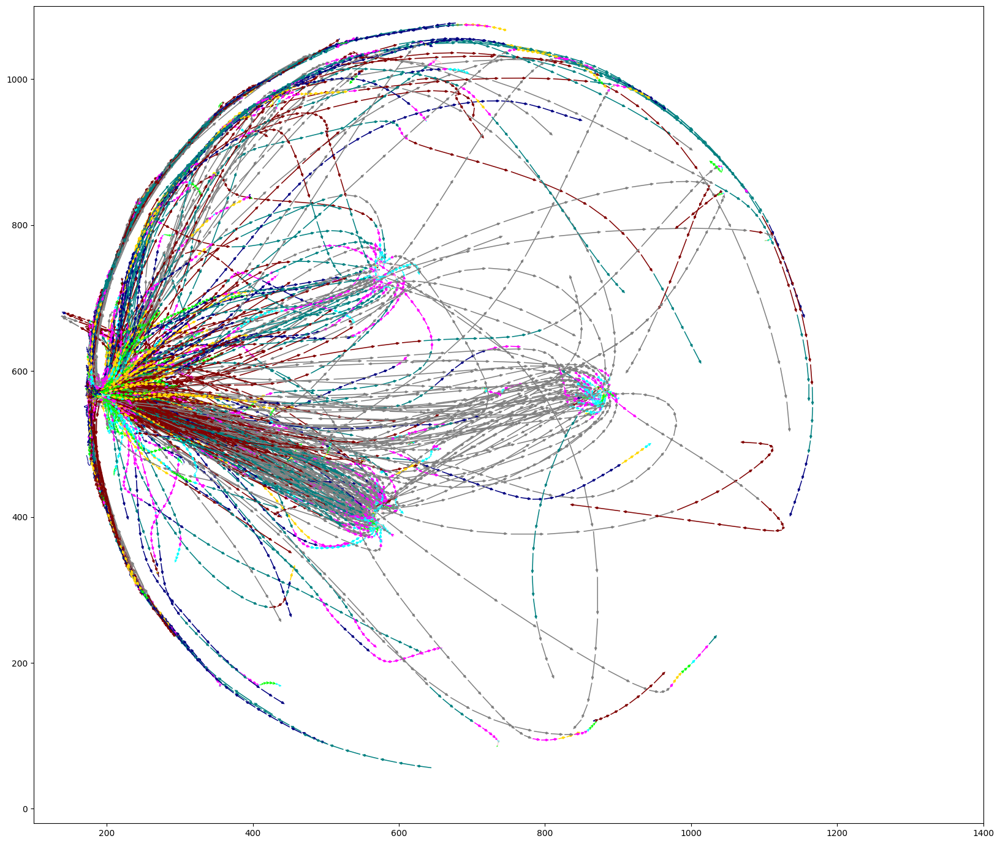

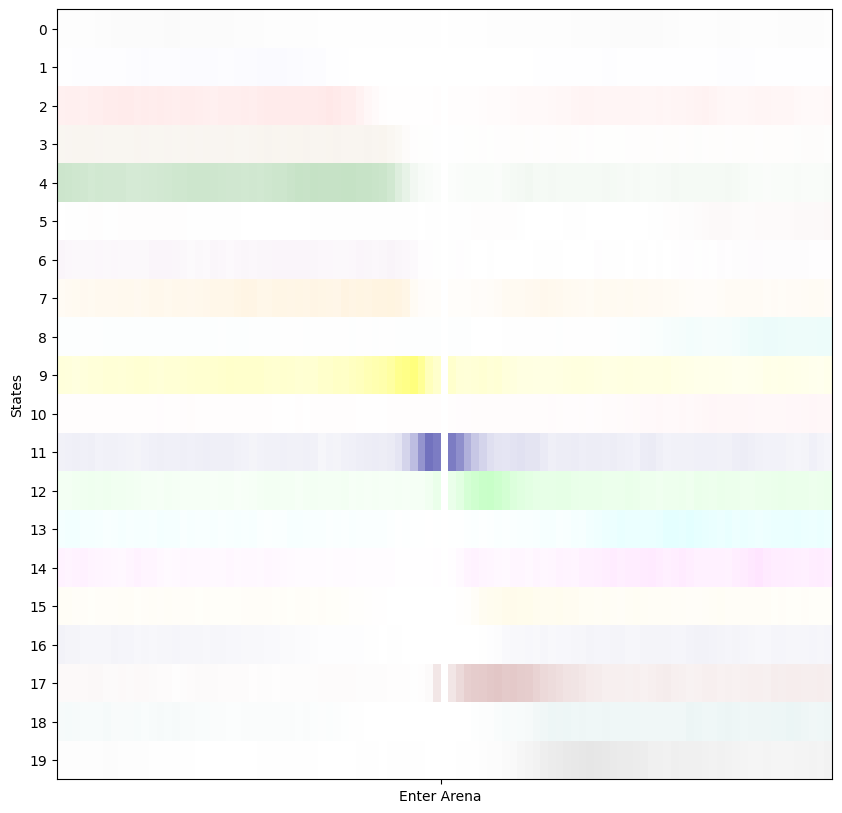

In [36]:
Characterize_Timepoints('Enter Arena', Entry, left_seconds = 5, right_seconds = 5, file_name = 'EnterArena')

### ***ii. Enter Patch***

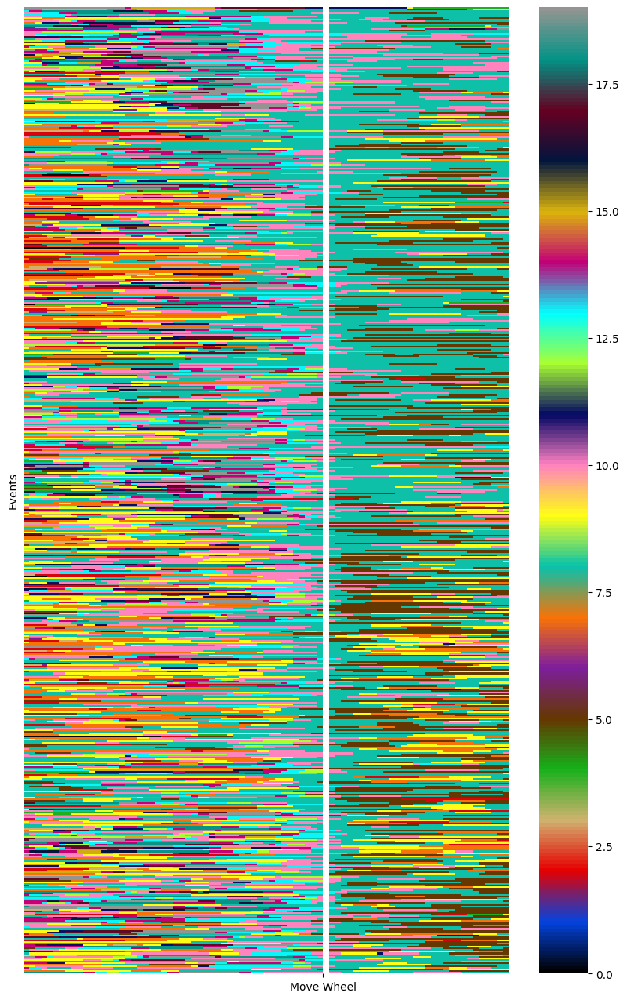

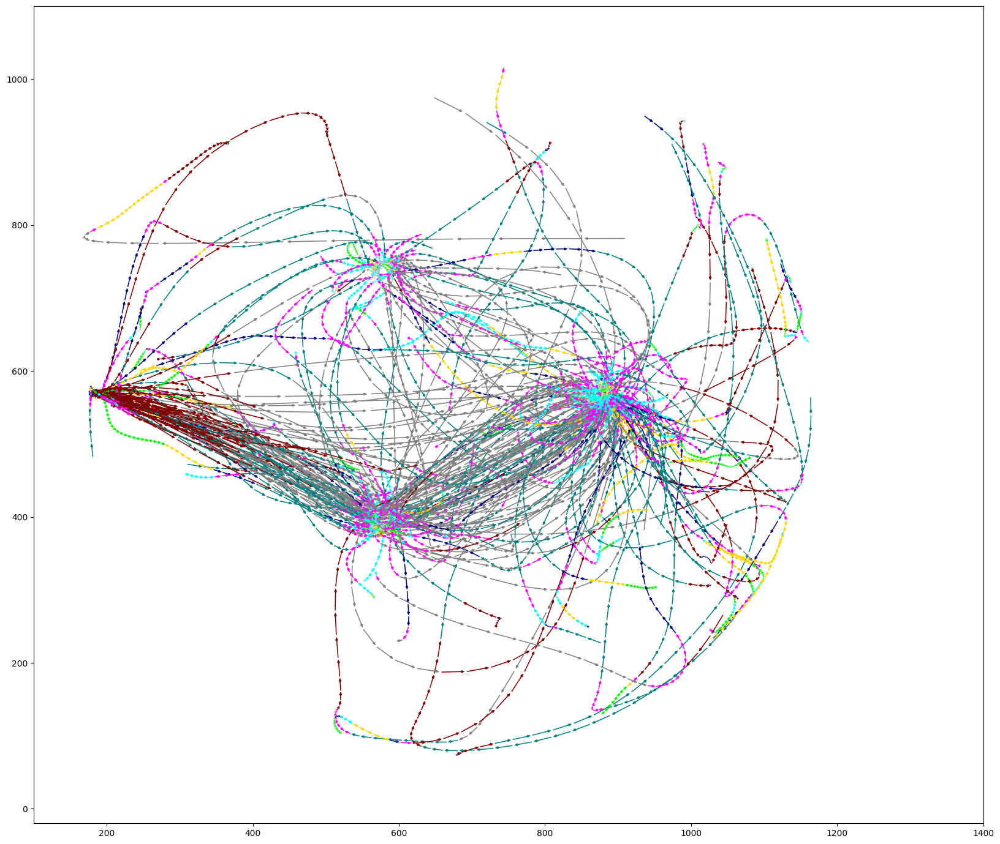

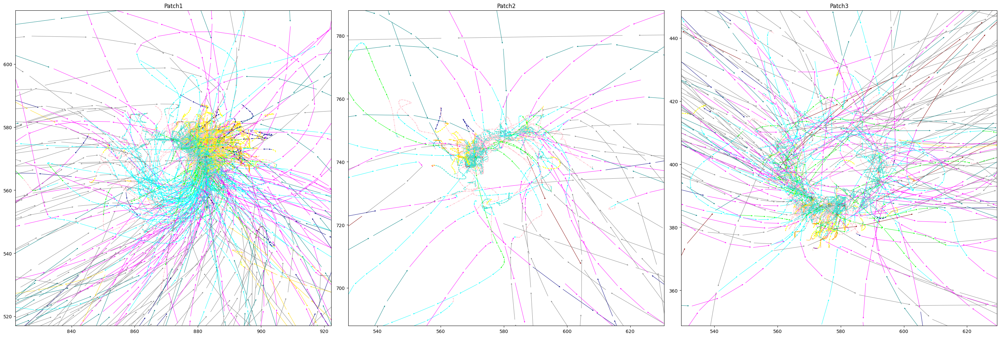

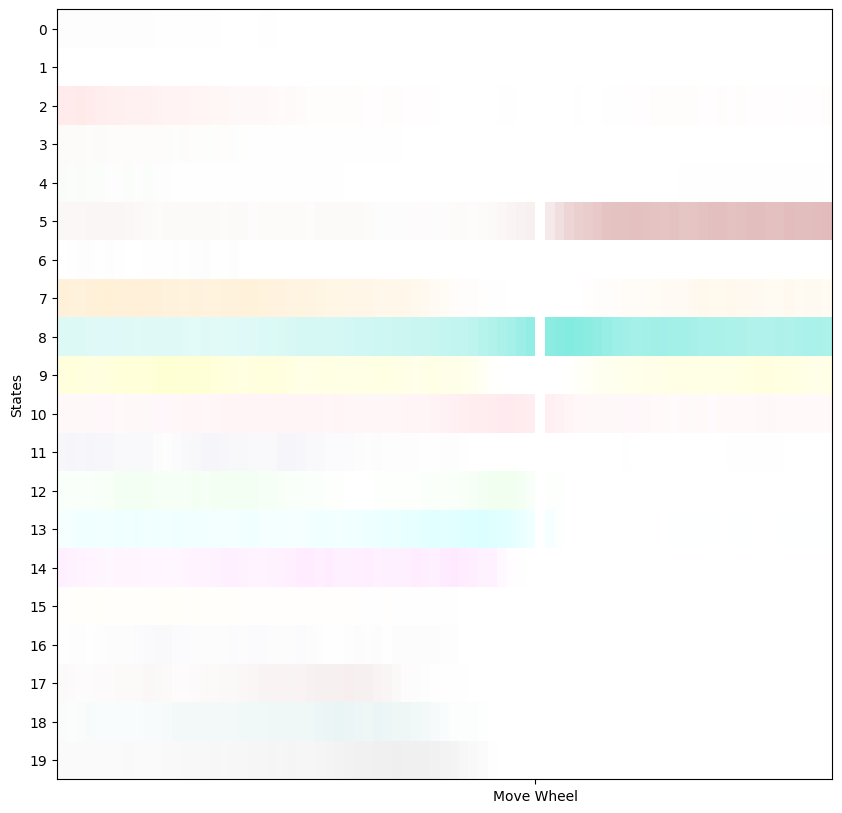

In [37]:
Characterize_Timepoints('Move Wheel', Starts, left_seconds = 5, right_seconds = 3, file_name = 'EnterVisit')

### ***iii. Leave Patch***

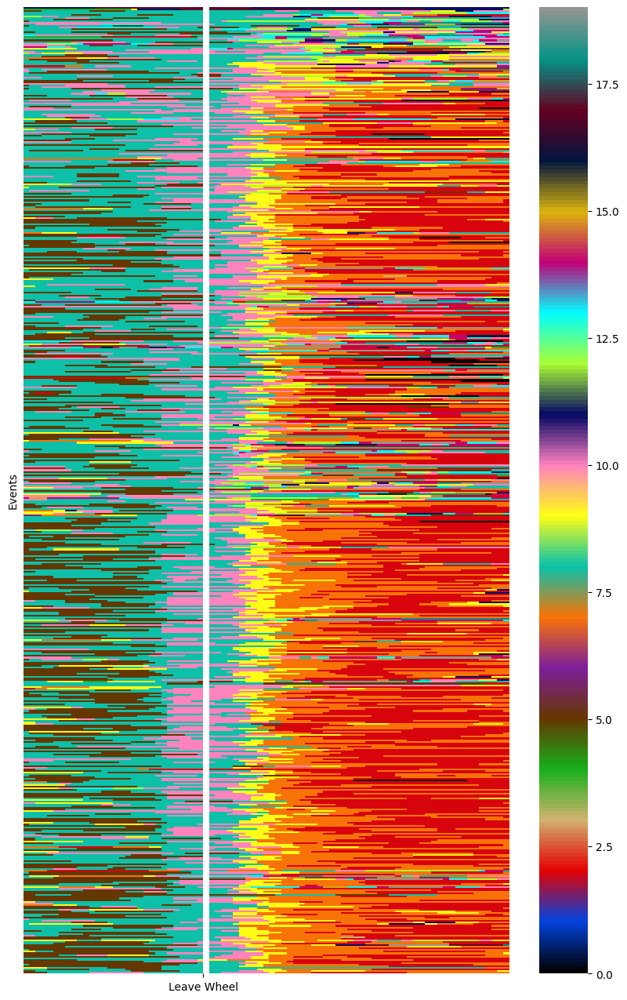

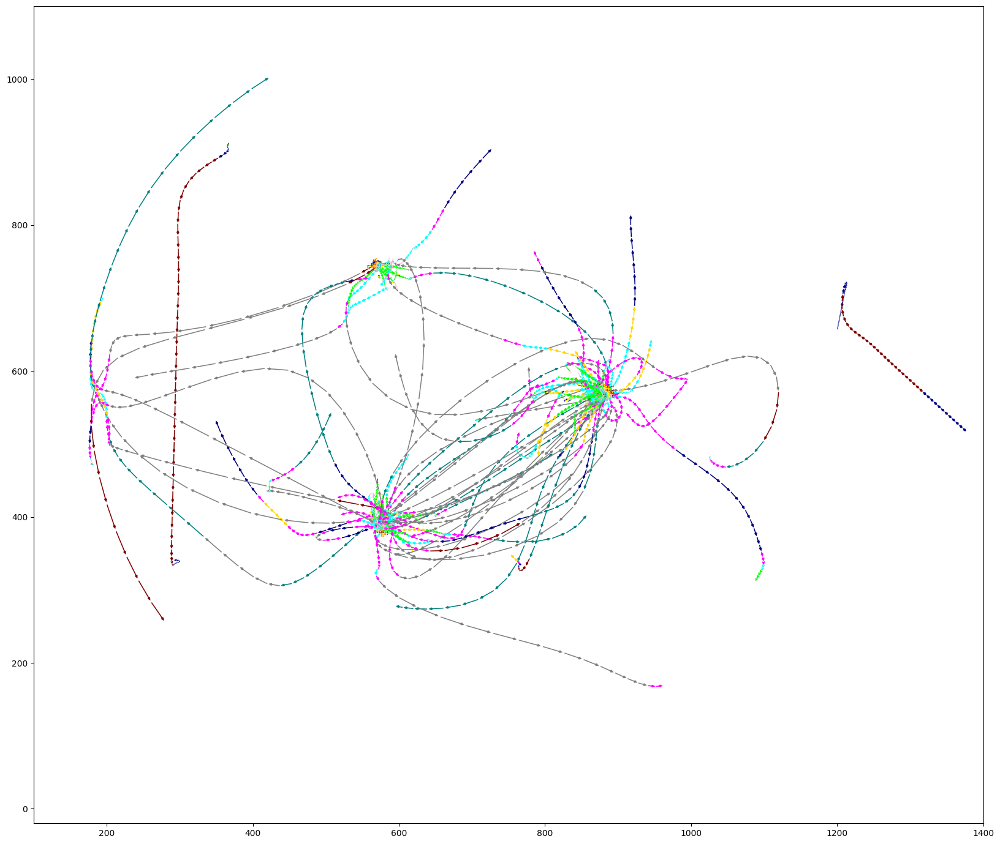

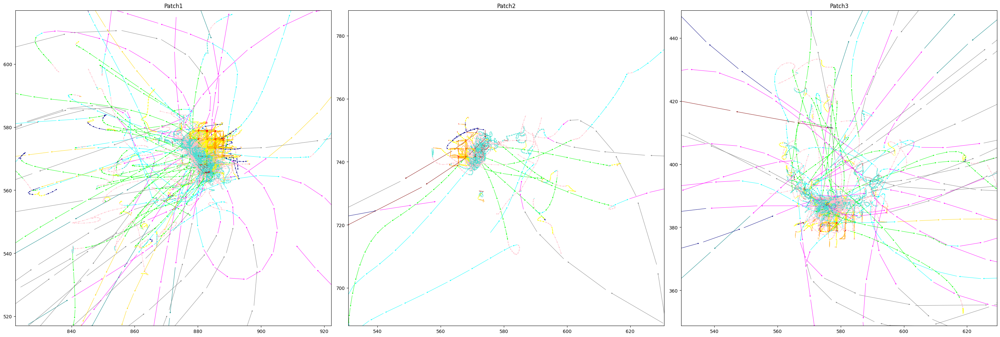

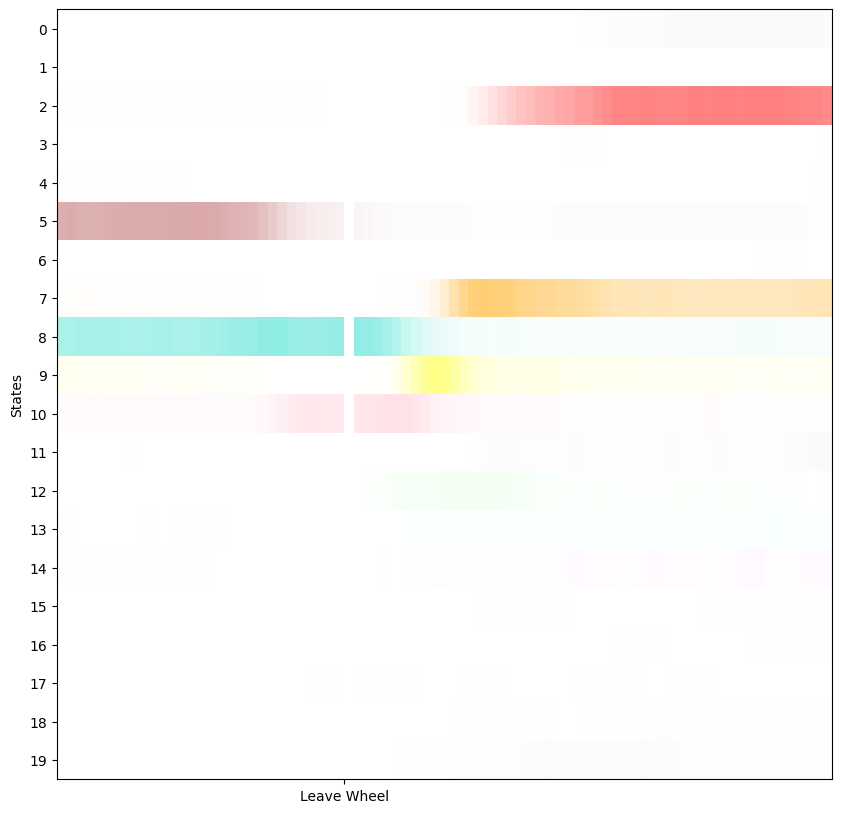

In [38]:
Characterize_Timepoints('Leave Wheel', Ends, left_seconds = 3, right_seconds = 5, file_name = 'EndVisit')

### ***iv. Pellet Deliveries***

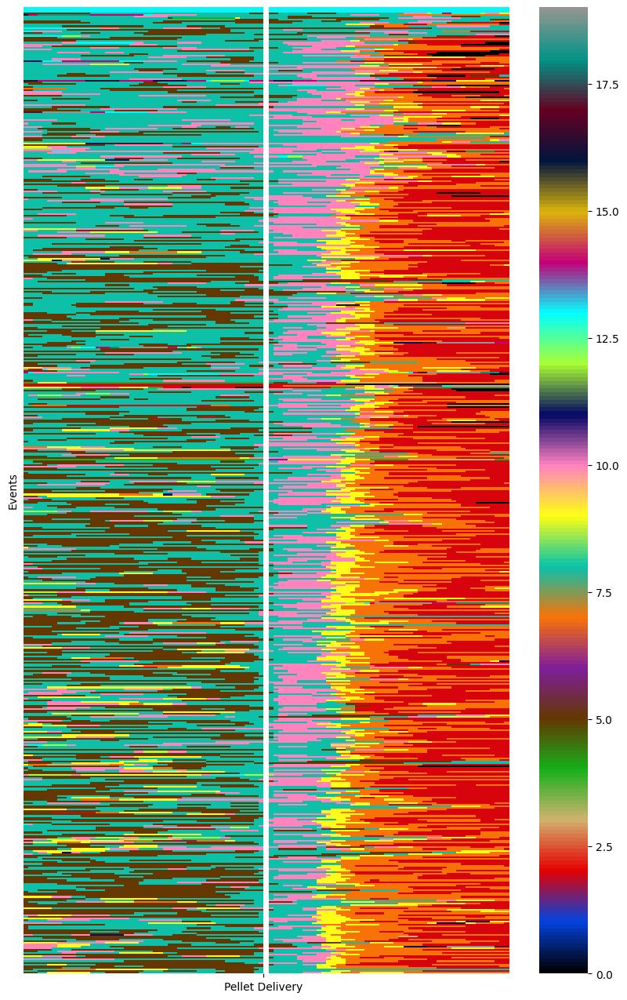

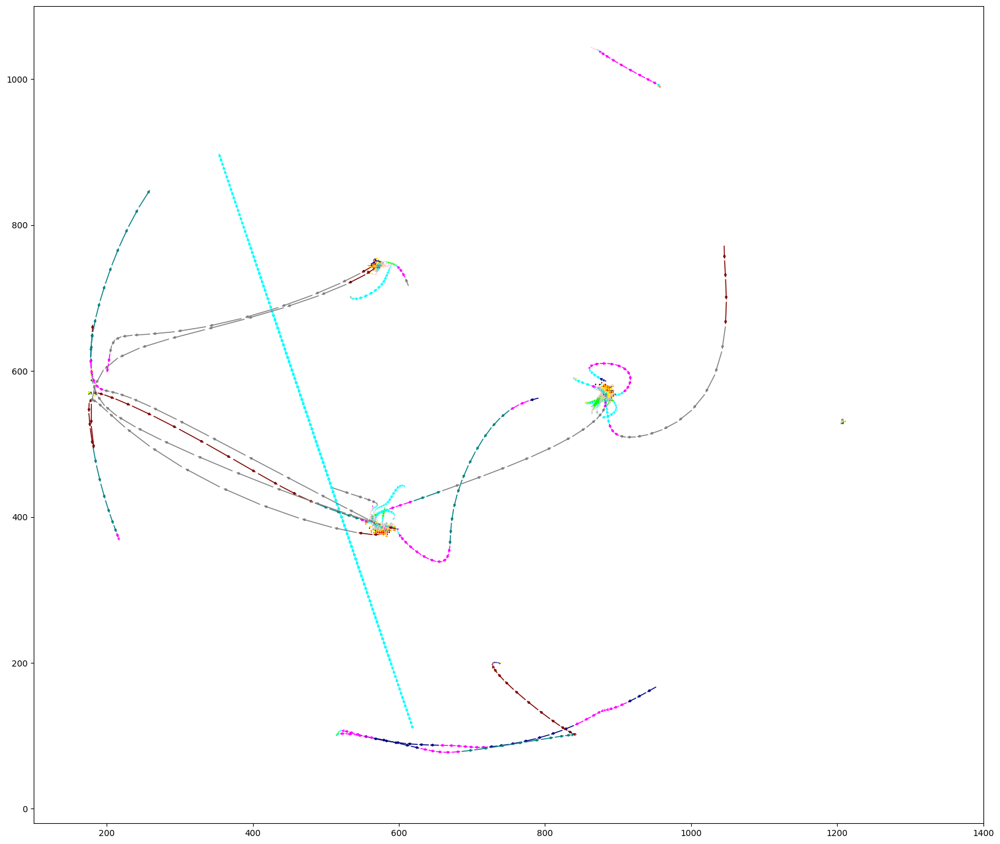

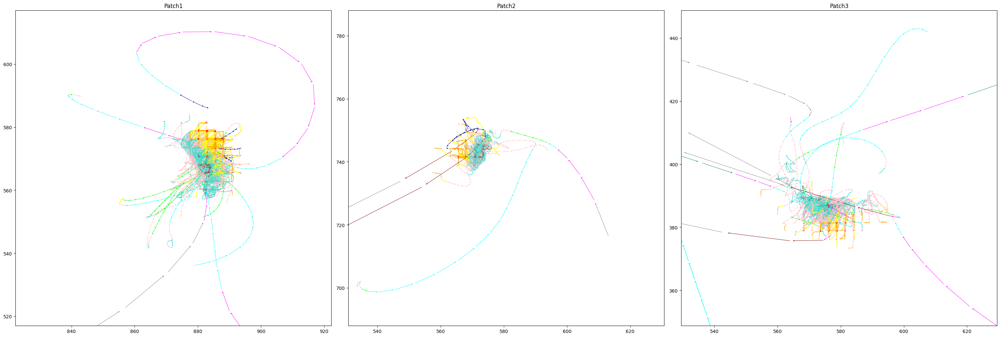

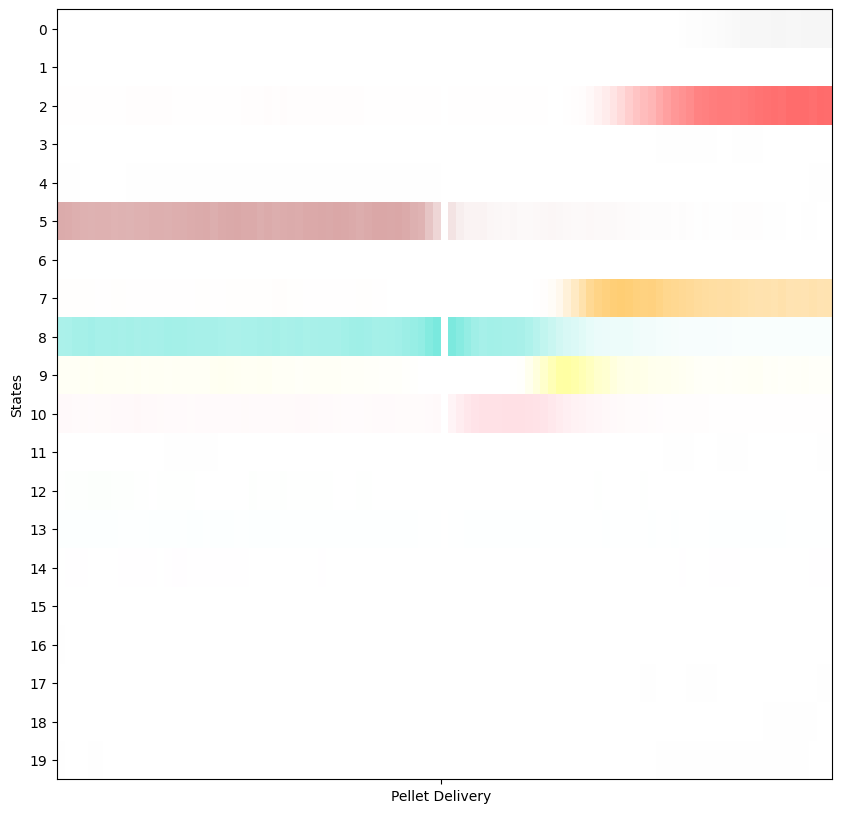

In [39]:
Characterize_Timepoints('Pellet Delivery', Pellets, left_seconds = 5, right_seconds = 5, file_name = 'PelletDelivery')

## ***IV. Prediction of Events***

In [40]:
def Calculate_Probability_Curve(characterized_states_curve = [], time_shifts = [], means = [], variances = []):
    T = len(characterized_states_curve[0])
    P = np.ones(T)
    p_ = []
    
    for i in range(len(characterized_states_curve)):
        p = np.zeros(T)
        characterized_state, time_shift, mean, variance = characterized_states_curve[i], time_shifts[i], means[i], variances[i]
        if time_shift < 0:
            p[-time_shift:] = np.exp(-((characterized_state[:time_shift] - mean) ** 2) / (2 * variance ** 2))
        else:
            p[:-time_shift] = np.exp(-((characterized_state[time_shift:] - mean) ** 2) / (2 * variance ** 2))
        p_.append(p)

    for p in p_: P *= p
    return P

def Summarize(event_name, Events):
    mouse_pos_ = mouse_pos.copy()[Active_Chunk[0]:Active_Chunk[1]]
    Events = Events[Events > Active_Chunk[0]]
    Events = Events[Events < Active_Chunk[1]]

    COUNT_CURVES = [[] for _ in range(N)]
    COUNT_CURVES_MAX = []
    for i in range(N):
        count_curves = Mouse.hmm.process_states.Event_Triggering(mouse_pos_, Events, left_seconds = 5, right_seconds = 5, variable = 'State' + str(i), insert_nan = 0)
        COUNT_CURVES[i] = np.mean(np.array(count_curves), axis = 0)
        COUNT_CURVES_MAX.append(np.max(COUNT_CURVES[i]))

    Peaks_index = np.argsort(COUNT_CURVES_MAX)
    if COUNT_CURVES_MAX[Peaks_index[-4]] > 0.4: threshold = COUNT_CURVES_MAX[Peaks_index[-4]]
    elif COUNT_CURVES_MAX[Peaks_index[-3]] < 0.4: threshold = COUNT_CURVES_MAX[Peaks_index[-3]]
    else: threshold = 0.4
    
    characterized_states, characterized_states_peak, characterized_states_names, time_shifts = [], [], [], []
    for i in range(N):
        if np.max(COUNT_CURVES[i]) > threshold:
            characterized_states.append(i)
            characterized_states_peak.append(np.max(COUNT_CURVES[i]))
            characterized_states_names.append('State'+str(i))
            max_index = np.argsort(COUNT_CURVES[i], -1)[-1]
            time_shifts.append(max_index - 50 + 3)
    return characterized_states, characterized_states_peak, characterized_states_names, time_shifts
    
def Predict(event_name, Events, file_name):
    characterized_states, characterized_states_peak, characterized_states_names, time_shifts = Summarize(event_name, Events)
    means = [1, 1,1,1,1,1, 1, 1,1,1,1,1]
    variances = [0.1, 0.1, 0.1,0.1,0.1, 0.1, 0.1, 0.1, 0.1,0.1,0.1, 0.1]
    
    if len(characterized_states) == 0:
        return 'No states characterized'

    characterized_states_curve = []
    for i in range(len(characterized_states)):
        characterized_states_curve.append(mouse_pos.loc[mouse_pos.index, characterized_states_names[i]].to_numpy())
    probability_curve = Calculate_Probability_Curve(characterized_states_curve, time_shifts = time_shifts, means = characterized_states_peak, variances = variances)
    mouse_pos.loc[mouse_pos.index, 'prob'] = probability_curve

    COUNT_CURVES = [[] for _ in range(len(characterized_states_curve))]
    Events = Events[Events > Predicting_Chunk_start]
    PROB = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds = 5, right_seconds = 5, variable = 'prob', insert_nan = 0)
    for i in range(len(characterized_states_curve)):
        COUNT_CURVES[i] = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds = 5, right_seconds = 5, variable = characterized_states_names[i], insert_nan = 0)
    
    fig, axs = plt.subplots(1, 1, figsize=(10, 6))
    T = np.arange(-50, 50, 1)
    for i in range(len(characterized_states_curve)):
        axs.plot(T, np.mean(np.array(COUNT_CURVES[i]), axis = 0), label = characterized_states_names[i], color = color_names[int(characterized_states_names[i][-1])], linestyle = '--')
    axs.axvline(x = 0, color = 'red')
    axs.legend(loc = 'upper right')
    axs_ = axs.twinx()
    axs_.plot(T, np.mean(np.array(PROB), axis = 0), color = 'black', label = 'Pred.')
    axs_.legend(loc = 'lower right')
    plt.show()
    #plt.savefig('../Images/Social_HMM/' + file_name + '/' + Mouse_title + '_Prediction.png')
    
    return 'Predicton for ' + file_name + ' Completed'
    
Mouse_title = Mouse.type + '_' + Mouse.mouse
mouse_pos = Mouse.mouse_pos
N = Mouse.hmm.n_state
states = Mouse.hmm.states
mouse_pos['state'] = pd.Series(states, index = mouse_pos.index)

Pellets = Mouse.arena.pellets.index
Visits = Mouse.arena.visits
Entry = Mouse.arena.entry 
Starts = Visits['start'].to_numpy()
Ends = Visits['end'].to_numpy()

Active_Chunk = Mouse.active_chunk
Predicting_Chunk_start = Active_Chunk[1] + pd.Timedelta('1S')

mouse_pos = Mouse.hmm.process_states.State_Timewindow(mouse_pos, timewindow = 10)

### ***i. Enter Arena***

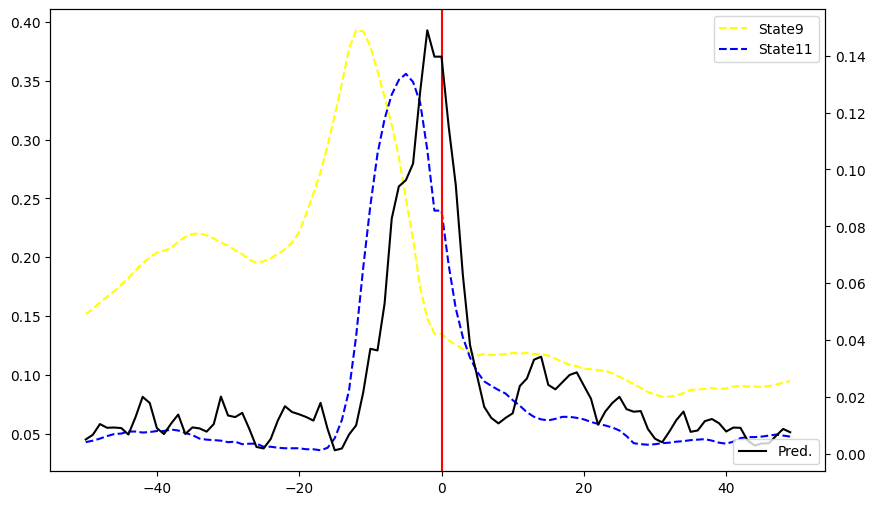

In [41]:
result = Predict(event_name = 'Enter Arena', Events = Entry, file_name = 'EnterArena')

### ***ii. Enter Patch***

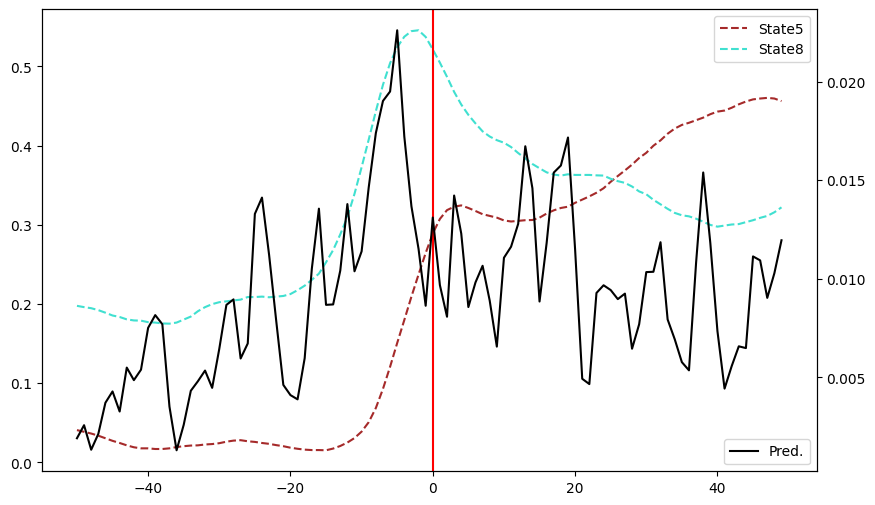

In [42]:
result = Predict(event_name = 'Move Wheel', Events = Starts, file_name = 'EnterVisit')

### ***iii. Leave Patch***

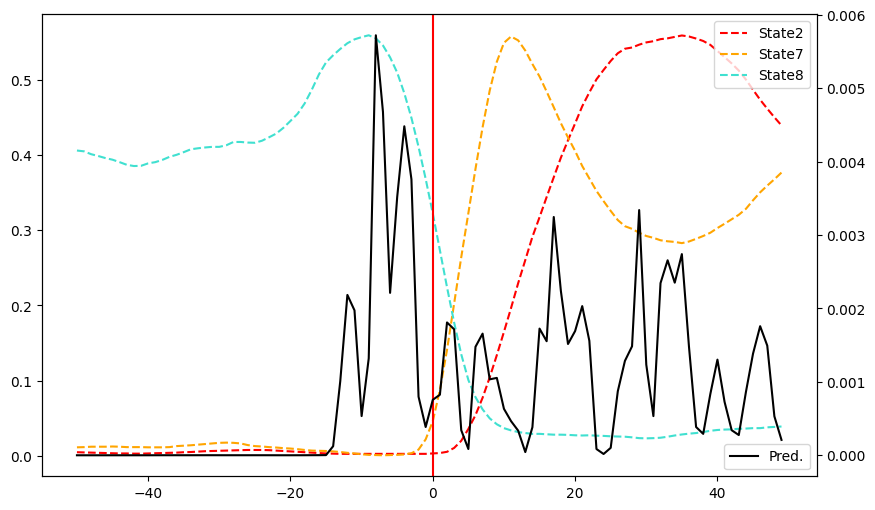

In [43]:
result = Predict(event_name = 'Leave Wheel', Events = Ends, file_name = 'EndVisit')

### ***iv. Pellet Delivery***

In [44]:
df = (Pellets[1:] - Pellets[:-1]).total_seconds()
df

Index([   1.558976173,    2.282015801, 9909.688992023,   208.84201622,
         40.355999947, 1307.381983757,   91.710016251,   20.687999725,
         99.985983848,  274.814016343,
       ...
          73.10700798,   89.007999897,  405.826975822,   87.920000077,
         59.333024025,   81.559999942,   73.685984135,  941.314015865,
         49.099999905,   63.618976116],
      dtype='float64', name='time', length=585)

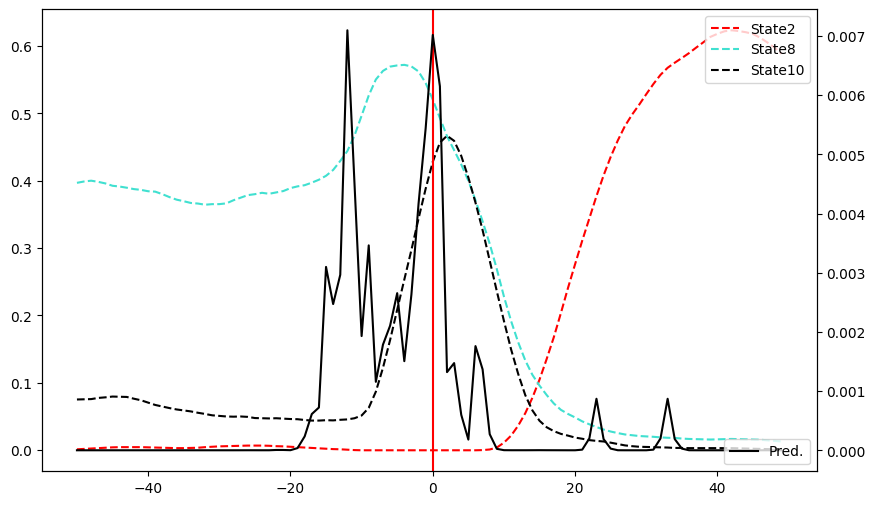

In [45]:
result = Predict(event_name = 'Pellet Delivery', Events = Pellets, file_name = 'PelletDelivery')

# **4. Display Regression Results of visit Duration**

In [46]:
def Display_Visit_Prediction(VISITS, model, file_path, title):
    regression = mouse.Regression(VISITS)
    regression.regressor = ['speed', 'acceleration', 'last_pellets_self', 'last_pellets_other','last_duration', 'last_interval','last_pellets_interval', 'entry']
    
    if model == 'linear': 
        obs, pred = regression.Linear_Regression()
    if model == 'MLP': 
        obs, pred = regression.Multilayer_Perceptron()
    
    fig, axs = plt.subplots(1, 1, figsize=(5, 5))
    axs.scatter(obs, pred, s = 10)    
    axs.set_xlabel('Observation', fontsize = 24)
    axs.set_ylabel('Prediction', fontsize = 24)
    axs.spines['top'].set_visible(False)
    axs.spines['right'].set_visible(False)
    #axs.legend(fontsize = 20)
    #axs.set_ylim((-max(obs)-1, max(obs)+1))
    plt.tight_layout()
    #plt.savefig(file_path + title)
    plt.show()

## ***I. Linear Regression***

/nfs/nhome/live/zimol/ProjectAeon/SURF/Functions/mouse.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.X['interc'] = 1


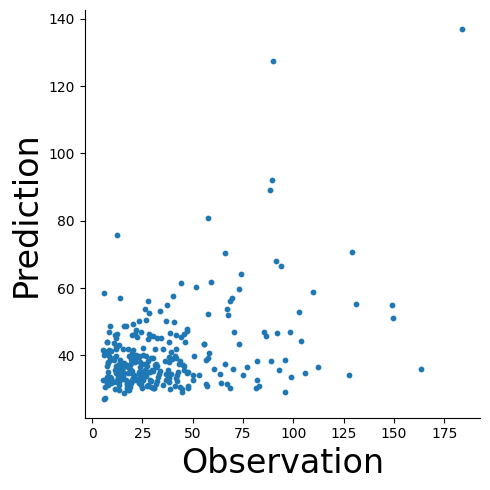

In [47]:
Display_Visit_Prediction(Mouse.arena.visits, model = 'linear', file_path = '../Images/Social_Regression/'+Mouse.type+'-'+Mouse.mouse+'/', title = 'Linear_Regression.png')                                            

## ***II. Multi-Layer Perceptron***

/nfs/nhome/live/zimol/ProjectAeon/SURF/Functions/mouse.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.X['interc'] = 1
2024-06-25 12:27:56.264729: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2024-06-25 12:27:56.276100: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (sgw2): /proc/driver/nvidia/version does not exist


Epoch 1/100
10/10 [==============================] - 1s 3ms/step - loss: 4974.4858 - mae: 43.7650
Epoch 2/100
10/10 [==============================] - 0s 4ms/step - loss: 3607.8176 - mae: 39.7165
Epoch 3/100
10/10 [==============================] - 0s 3ms/step - loss: 3631.8508 - mae: 40.6077
Epoch 4/100
10/10 [==============================] - 0s 3ms/step - loss: 3337.4392 - mae: 37.6711
Epoch 5/100
10/10 [==============================] - 0s 2ms/step - loss: 3437.0952 - mae: 38.4152
Epoch 6/100
10/10 [==============================] - 0s 4ms/step - loss: 3036.5347 - mae: 36.2506
Epoch 7/100
10/10 [==============================] - 0s 2ms/step - loss: 2842.1865 - mae: 35.4613
Epoch 8/100
10/10 [==============================] - 0s 2ms/step - loss: 3824.1868 - mae: 37.9934
Epoch 9/100
10/10 [==============================] - 0s 2ms/step - loss: 3009.0320 - mae: 35.5584
Epoch 10/100
10/10 [==============================] - 0s 3ms/step - loss: 3032.7595 - mae: 34.7732
Epoch 11/100
10/10 

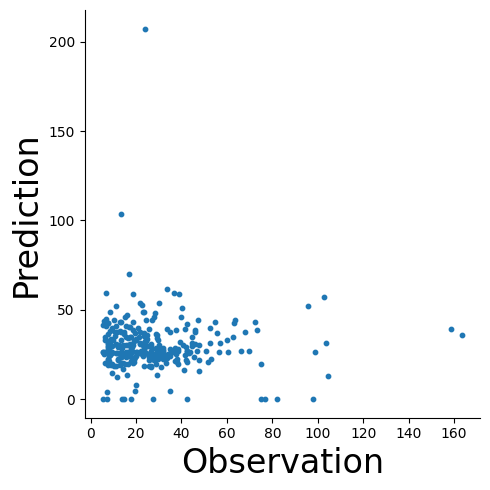

In [48]:
Display_Visit_Prediction(Mouse.arena.visits, model = 'MLP', file_path = '../Images/Social_Regression/'+Mouse.type+'-'+Mouse.mouse+'/', title = 'MLP.png')